### Effectiveness of binarization and a 2-pass retrieval system with ColPali

This is a quick exploration of ColPali. I had few hypothesis about this model and wanted to craft a mental model 
before I jumped into specifics/other ideas.

- Find out more about MaxSim operator, per token and per patch (image) embeddings in comparison to vanilla (chunk) embeddings.
- Does the bit-vector as 1st-pass, then 2nd-pass with the ones selected from 1st-pass (full precision), able to balance precision-recall in retrieval system? This is just exact search. 

Bit-vectors allow cheaper storage on memory and fast retrieval.

### ColPali

It's an elegant model+approach to understand documents without the grunt work of OCR (extract text, images, tables, ...) and the messy pipeline for context representation and association of them. 


| &nbsp; |  |  |
|----------|----------|----------|
| Architecture, Retrieval, ColBERT, VLM | 👉 | https://arxiv.org/abs/2407.01449 |
|                           Model repo | 👉 | https://github.com/illuin-tech/colpali |

### Setup

In [1]:
import os, tempfile
import rich

from dotenv import load_dotenv
load_dotenv(dotenv_path=os.path.realpath('../.env'))

True

In [2]:
%load_ext autoreload
%autoreload 2

In [ ]:
#!pip install --no-cache-dir transformers peft mteb pypdfium2 ipywidgets matplotlib seaborn[stats] einops ml_dtypes
#!pip install --no-cache-dir bitsandbytes>=0.39.0
#!pip install --no-cache-dir git+https://github.com/illuin-tech/colpali

In [2]:
import numpy as np
import torch
import datasets
import pypdfium2 as pdfium
import tqdm
import itertools
import gc
import ml_dtypes as mld

from transformers import AutoProcessor
from PIL import Image
from IPython.display import display
from typing_extensions import Any, Generator

from colpali_engine.models.paligemma_colbert_architecture import ColPali
from colpali_engine.utils.colpali_processing_utils import process_images, process_queries


In [3]:
datasets.disable_caching()

### Constants

These are parameterized so we can re-run the notebook.

In [4]:
# directory of pdf files
DATA_DIR = os.environ.get('COLPALI_DATA_DIR', os.path.join(tempfile.gettempdir(), 'colpali_data'))

# files we want to process
FILES = 'mva_alleghpittspa_rollout_dec21.pdf,climate_youth_magazine.pdf'

# self explanatory
BASE_MODEL = 'google/paligemma-3b-mix-448' #'vidore/colpaligemma-3b-mix-448-base'
ADAPTER_MODEL = 'vidore/colpali-v1.1'

# datasets live in HF_HOME, else uses temp folder
SAVE_DATASET_PATH = os.path.join(
    os.environ.get('HF_HOME') if os.path.exists(os.environ.get('HF_HOME', '')) else tempfile.gettempdir(), 
    'datasets', 
    'pdf_images'
)

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# no train and validation for now
SPLIT = 'test'

In [5]:
# check if data_dir exists
if not os.path.exists(DATA_DIR):
    raise FileNotFoundError(f'Directory {DATA_DIR} not found.')

### Schema of Image set

Setup a 'mini-database' of sorts that allows slicing the tensor and associate info we need.

```

pdf_images/
├── test/
├── metadata.jsonl
├── doc_vectors.pt
└── binary_doc_vectors.pt

```

- test: images as .jpg
- doc_vectors: full bf16/fp32 tensor
- binary_doc_vectors: bit vectors in uint8
- metadata.jsonl: see 👇

In [6]:
features = datasets.Features({
    'image': datasets.Image(decode=False),
    'pdf_filename': datasets.Value('string'),
    'page_number': datasets.Value('uint16'),
    #'text': datasets.Value('large_string'),
    'md5_digest': datasets.Value('string'),
    'tensor_idx': datasets.Value('uint32')
})

### Convert PDF to images

In [7]:
def pdf_to_images_gen(shards) -> Generator[dict[str, Any], None, None]:
    image_path = os.path.join(SAVE_DATASET_PATH, SPLIT)
    os.makedirs(image_path, exist_ok=True)
    tensor_idx = 0

    for pdf_path, dpi in shards:
        pdf_file_name = os.path.basename(pdf_path)
        pdf = pdfium.PdfDocument(pdf_path)
        print(f'Processing PDF: {pdf_file_name} // {pdf.get_page_label(0)} // Pages: {len(pdf)}')
        # re-scale resolution
        scale = dpi / 72
        
        try:
            import hashlib
            with open(pdf_path, 'rb') as file:
                pdf_hash = hashlib.md5(file.read()).hexdigest()
            
            for idx, page in enumerate(tqdm.notebook.tqdm(pdf), start=1):
                bitmap = page.render(scale=scale)
                pil_image:Image = bitmap.to_pil()
                per_image_path = f'{pdf_hash}_{idx}.jpg'
                pil_image.save(f'{image_path}/{per_image_path}')
                yield {
                    'tensor_idx': tensor_idx+idx-1,
                    'image': {'path': per_image_path, 'bytes': None}, 
                    'page_number': idx, 
                    'pdf_filename': pdf_file_name,
                    #'text': page.get_textpage().get_text_bounded(),
                    'md5_digest': pdf_hash
                }

            # record last page number
            tensor_idx = len(pdf)
        finally:
            pdf.close()

def batch_generator(shards, batch_size=64):
    gen = pdf_to_images_gen(shards)
    while True:
        batch = list(itertools.islice(gen, batch_size))
        if not batch:
            break
        yield batch

In [8]:
# extract and save images
import json

dpi = 100
os.makedirs(SAVE_DATASET_PATH, exist_ok=True)

shards = [(os.path.join(DATA_DIR, x), dpi) for x in FILES.split(',')]
with open(f'{SAVE_DATASET_PATH}/metadata.jsonl', 'w+') as fp:
    for batch in batch_generator(shards):
        for item in batch:
            json.dump(item, fp)
            fp.write('\n')

Processing PDF: mva_alleghpittspa_rollout_dec21.pdf //  // Pages: 56


  0%|          | 0/56 [00:00<?, ?it/s]

Processing PDF: climate_youth_magazine.pdf // cov1 // Pages: 32


  0%|          | 0/32 [00:00<?, ?it/s]

### Setup few utils

In [9]:
# utils 

def create_iterable_dataset_from_images(gen, pdf_paths, dpi=200):
    iter_dataset:datasets.IterableDataset = datasets.IterableDataset.from_generator(
        gen,
        gen_kwargs={'shards': [(pdf_path, dpi) for pdf_path in pdf_paths]},
        features=features,
        split=datasets.Split.TEST
    )
    return iter_dataset

def cleanup_dataset(ds):
    ds.cleanup_cache_files()

def save_dataset(ds:datasets.Dataset, path:str='pdf_images'):
    ds.save_to_disk(SAVE_DATASET_PATH, num_proc=1)

def delete_dataset(path:str):
    import shutil
    shutil.rmtree(path)

def datasets_info(ds:datasets.Dataset):
    info = (
    f'Cache Files: {ds.cache_files}\n'
    f'Columns: {ds.num_columns}\n'
    f'Rows: {ds.num_rows}\n'
    f'Column Names: {ds.column_names}\n'
    f'Shape: {ds.shape}\n'
    f'Size (MB): {ds._estimate_nbytes() / (1024*1024)}'
    )
    rich.print(info)

def tensor_info(t:torch.Tensor):
    device = t.device if hasattr(t, 'device') else ''
    info = (
    f'Shape: {t.shape}\n'
    f'Dtype: {t.dtype}\n'
    f'Device: {device}\n'
    f'Memory: {t.nbytes / (1024*1024)} MB'
    )
    rich.print(info)

def hamming_score(x,y):
    """larger score is better"""
    score = (np.sum(x == y) / len(x))
    return score

def packbits(x:torch.Tensor, axis:int=None) -> torch.Tensor:
    """
    Pack bits into bytes.

    We need it avoid 'casting-hell' i.e. bf16 -> fp32 (numpy) -> bf16.
    Stick to PyTorch as much as possible.
    """
    x = x.flatten() if axis is None else x.transpose(axis, -1)
    # ensure the last dimension is divisible by 8
    if (k:=x.shape[-1] % 8) != 0:
        # pad with zeros to make it divisible by 8
        x = torch.nn.functional.pad(x, (0, 8 - k))
    # reshape to group bits into bytes; convert boolean values to integers (0 or 1)
    x = x.reshape(*x.shape[:-1], -1, 8).to(torch.uint8)
    # element-dot([1,0,1,...], [128,64,...1]); sum to get packed bytes
    powers_of_two = 2 ** torch.arange(start=7, end=-1, step=-1, dtype=torch.uint8, device=x.device)
    packed = (x * powers_of_two).sum(dim=-1, dtype=torch.uint8)
    if axis is not None:
        packed = packed.transpose(axis, -1)
    return packed

# register custom operators
torch.library.custom_op("tlib::packbits", packbits, mutates_args={'x'})


<CustomOpDef(tlib::packbits)>

In [10]:
# create dataset from pdf images

def get_dataset(split=SPLIT):
    metadata = []
    with open(f'{SAVE_DATASET_PATH}/metadata.jsonl', 'r') as fp:
        for line in fp:
            line = json.loads(line)
            line['image']['path'] = os.path.join(SAVE_DATASET_PATH, split, line['image']['path'])
            metadata.append(line) 
        dataset = datasets.Dataset.from_list(metadata, features=features, split='test')
    return dataset

ds = get_dataset()
datasets_info(ds)

Cache Files: []
Columns: 5
Rows: 88
Column Names: ['tensor_idx', 'image', 'page_number', 'pdf_filename', 'md5_digest']
Shape: (88, 5)
Size (MB): 10.812682151794434

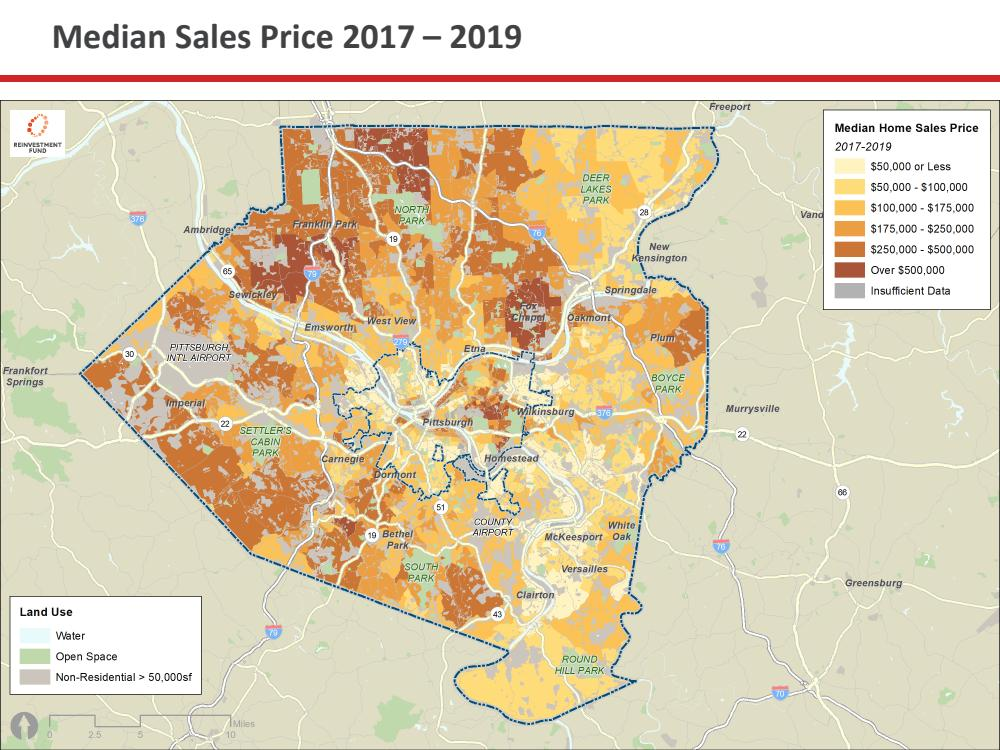

In [21]:
# pick a random image and display it
display(ds.cast_column('image', datasets.Image())[ np.random.randint(0, len(ds)) ]['image'])

In [14]:
del ds
gc.collect()

205

### Load Model

In [11]:
model = ColPali.from_pretrained(
    BASE_MODEL, 
    torch_dtype=torch.bfloat16, 
    device_map="cuda"
).eval()
model.load_adapter(ADAPTER_MODEL)
processor = AutoProcessor.from_pretrained(ADAPTER_MODEL)

rich.inspect(model)
rich.print(model)


/mnt/c/Documents/anaconda/envs/ml/lib/python3.11/site-packages/transformers/models/paligemma/configuration_paligemma.py:137: FutureWarning: The `vocab_size` attribute is deprecated and will be removed in v4.44, Please use `text_config.vocab_size` instead.
  warnings.warn(
`config.hidden_act` is ignored, you should use `config.hidden_activation` instead.
Gemma's activation function will be set to `gelu_pytorch_tanh`. Please, use
`config.hidden_activation` if you want to override this behaviour.
See https://github.com/huggingface/transformers/pull/29402 for more details.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Some weights of ColPali were not initialized from the model checkpoint at google/paligemma-3b-mix-448 and are newly initialized: ['custom_text_proj.bias', 'custom_text_proj.weight', 'language_model.lm_head.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


╭─ ColPali(   (model): PaliGemmaForConditionalGeneration(     (vision_tower): SiglipVisionModel(       (vision_mo─╮
│ def (*args, **kwargs):                                                                                          │
│                                                                                                                 │
│               base_model_prefix = 'model'                                                                       │
│                 call_super_init = False                                                                         │
│                          config = PaliGemmaConfig {                                                             │
│                                     "_name_or_path": "google/paligemma-3b-mix-448",                             │
│                                     "architectures": [                                                          │
│                                       "PaliGemmaForConditionalGeneration"                                       │
│                                     ],                                                                          │
│                                     "bos_token_id": 2,                                                          │
│                                     "eos_token_id": 1,                                                          │
│                                     "hidden_size": 2048,                                                        │
│                                     "ignore_index": -100,                                                       │
│                                     "image_token_index": 257152,                                                │
│                                     "model_type": "paligemma",                                                  │
│                                     "pad_token_id": 0,                                                          │
│                                     "projection_dim": 2048,                                                     │
│                                     "text_config": {                                                            │
│                                       "hidden_size": 2048,                                                      │
│                                       "intermediate_size": 16384,                                               │
│                                       "model_type": "gemma",                                                    │
│                                       "num_attention_heads": 8,                                                 │
│                                       "num_hidden_layers": 18,                                                  │
│                                       "num_image_tokens": 1024,                                                 │
│                                       "num_key_value_heads": 1,                                                 │
│                                       "torch_dtype": "float32",                                                 │
│                                       "vocab_size": 257216                                                      │
│                                     },                                                                          │
│                                     "torch_dtype": "float32",                                                   │
│                                     "transformers_version": "4.44.2",                                           │
│                                     "vision_config": {                                                          │
│                                       "hidden_size": 1152,                                                      │
│                                       "image_size": 448,                                                        │
│                                       "intermediate_si

ColPali(
  (model): PaliGemmaForConditionalGeneration(
    (vision_tower): SiglipVisionModel(
      (vision_model): SiglipVisionTransformer(
        (embeddings): SiglipVisionEmbeddings(
          (patch_embedding): Conv2d(3, 1152, kernel_size=(14, 14), stride=(14, 14), padding=valid)
          (position_embedding): Embedding(1024, 1152)
        )
        (encoder): SiglipEncoder(
          (layers): ModuleList(
            (0-26): 27 x SiglipEncoderLayer(
              (self_attn): SiglipSdpaAttention(
                (k_proj): Linear(in_features=1152, out_features=1152, bias=True)
                (v_proj): Linear(in_features=1152, out_features=1152, bias=True)
                (q_proj): Linear(in_features=1152, out_features=1152, bias=True)
                (out_proj): Linear(in_features=1152, out_features=1152, bias=True)
              )
              (layer_norm1): LayerNorm((1152,), eps=1e-06, elementwise_affine=True)
              (mlp): SiglipMLP(
                (activation_fn): PytorchGELUTanh()
                (fc1): Linear(in_features=1152, out_features=4304, bias=True)
                (fc2): Linear(in_features=4304, out_features=1152, bias=True)
              )
              (layer_norm2): LayerNorm((1152,), eps=1e-06, elementwise_affine=True)
            )
          )
        )
        (post_layernorm): LayerNorm((1152,), eps=1e-06, elementwise_affine=True)
      )
    )
    (multi_modal_projector): PaliGemmaMultiModalProjector(
      (linear): Linear(in_features=1152, out_features=2048, bias=True)
    )
    (language_model): GemmaForCausalLM(
      (model): GemmaModel(
        (embed_tokens): Embedding(257216, 2048, padding_idx=0)
        (layers): ModuleList(
          (0-17): 18 x GemmaDecoderLayer(
            (self_attn): GemmaSdpaAttention(
              (q_proj): lora.Linear(
                (base_layer): Linear(in_features=2048, out_features=2048, bias=False)
                (lora_dropout): ModuleDict(
                  (default): Dropout(p=0.1, inplace=False)
                )
                (lora_A): ModuleDict(
                  (default): Linear(in_features=2048, out_features=32, bias=False)
                )
                (lora_B): ModuleDict(
                  (default): Linear(in_features=32, out_features=2048, bias=False)
                )
                (lora_embedding_A): ParameterDict()
                (lora_embedding_B): ParameterDict()
              )
              (k_proj): lora.Linear(
                (base_layer): Linear(in_features=2048, out_features=256, bias=False)
                (lora_dropout): ModuleDict(
                  (default): Dropout(p=0.1, inplace=False)
                )
                (lora_A): ModuleDict(
                  (default): Linear(in_features=2048, out_features=32, bias=False)
                )
                (lora_B): ModuleDict(
                  (default): Linear(in_features=32, out_features=256, bias=False)
                )
                (lora_embedding_A): ParameterDict()
                (lora_embedding_B): ParameterDict()
              )
              (v_proj): lora.Linear(
                (base_layer): Linear(in_features=2048, out_features=256, bias=False)
                (lora_dropout): ModuleDict(
                  (default): Dropout(p=0.1, inplace=False)
                )
                (lora_A): ModuleDict(
                  (default): Linear(in_features=2048, out_features=32, bias=False)
                )
                (lora_B): ModuleDict(
                  (default): Linear(in_features=32, out_features=256, bias=False)
                )
                (lora_embedding_A): ParameterDict()
                (lora_embedding_B): ParameterDict()
              )
              (o_proj): lora.Linear(
                (base_layer): Linear(in_features=2048, out_features=2048, bias=False)
                (lora_dropout): ModuleDict(
                  (default): Dropout(p=0.1, inplace=False)
                )
                (lora_A): ModuleDict(
        

### Extract Document Tensors

Create a doc tensor by going through all the images extracted from PDFs.

In [12]:
doc_vectors = []

dataloader = torch.utils.data.DataLoader(
    (get_dataset().to_iterable_dataset(num_shards=1).cast_column('image', datasets.Image())
    ),
    batch_size=4,
    shuffle=False,
    num_workers=4,
    collate_fn=lambda x: process_images(processor, [img['image'] for img in x])
)

for batch_doc in tqdm.notebook.tqdm(dataloader):
    with torch.no_grad():
        batch_doc = {k: v.to(model.device) for k, v in batch_doc.items()}
        #with torch.backends.cuda.sdp_kernel(enable_flash=True, enable_math=False, enable_mem_efficient=False):
        embeddings_doc = model(**batch_doc) # (batch_size, n_patches, embedding_dim)
    doc_vectors.append(embeddings_doc.to('cpu'))
    
# convert the doc_vectors to tensor of shape (n_pages, n_patches, embedding_dim)
doc_vectors = torch.cat(doc_vectors, dim=0)
        

0it [00:00, ?it/s]

Too many dataloader workers: 4 (max is dataset.n_shards=1). Stopping 3 dataloader workers.


In [17]:
rich.print(doc_vectors.shape)

torch.Size([88, 1030, 128])

### Index the document vectors (Not really!!!)

save both bf16 and bit vectors

```python
- An image of shape (1030x128) in bf16: 
        ((1030*128)*16 bits) / (8*1024*1024) ~ 0.25 MB (256 KB)
- An image of shape (1030x16) with bit packing in uint8: 
        ((1030*16)*8 bits) / (8*1024*1024) ~ 0.0157 MB (16 KB)
```

In [18]:
tensor_info(doc_vectors)

Shape: torch.Size([88, 1030, 128])
Dtype: torch.bfloat16
Device: cpu
Memory: 22.12890625 MB

In [19]:
torch.save(doc_vectors, f'{SAVE_DATASET_PATH}/doc_vectors.pt')

In [20]:
# convert bf16 to bit vectors (bf16/8 = 128/8 = 16)
binary_doc_vectors = torch.ops.tlib.packbits(doc_vectors > 0, axis=-1)
tensor_info(binary_doc_vectors)

torch.save(binary_doc_vectors, f'{SAVE_DATASET_PATH}/binary_doc_vectors.pt')

Shape: torch.Size([88, 1030, 16])
Dtype: torch.uint8
Device: cpu
Memory: 1.383056640625 MB

In [21]:
f'Percentage Memory Savings: {(1 - (binary_doc_vectors.nbytes / doc_vectors.nbytes)) * 100:.2f}%'

'Percentage Memory Savings: 93.75%'

In [22]:
del doc_vectors
del binary_doc_vectors
gc.collect()

94

### Extract Query Vectors

In [13]:
query_vectors = []

queries = [
    'show the median home sales price between 2017 and 2019',
    'show the distribution of race in Allegheny county',
    'What is carbon footprint?'
]

if len(queries) > 1:
    dataloader = torch.utils.data.DataLoader(
        queries,
        batch_size=4,
        shuffle=False,
        num_workers=4,
        collate_fn=lambda x: process_queries(processor, x, Image.new("RGB", (448, 448), (255, 255, 255)))
    )
    for batch_query in tqdm.notebook.tqdm(dataloader):
        with torch.no_grad():
            batch_query = {k: v.to(model.device) for k, v in batch_query.items()}
            embeddings_query = model(**batch_query) # (batch_size, n_tokens, embedding_dim)
        query_vectors.append(embeddings_query.to('cpu'))
else:
    with torch.no_grad():
        batch_query = process_queries(processor, queries, Image.new("RGB", (448, 448), (255, 255, 255)))
        batch_query = {k: v.to(model.device) for k, v in batch_query.items()}
        embeddings_query = model(**batch_query) # (1, n_tokens, embedding_dim)
    query_vectors.append(embeddings_query.to("cpu"))

# convert the query_vectors to tensor of shape (n_queries, n_tokens, embedding_dim)
query_vectors = torch.cat(query_vectors, dim=0)

  0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
tensor_info(query_vectors)

Shape: torch.Size([3, 27, 128])
Dtype: torch.bfloat16
Device: cpu
Memory: 0.019775390625 MB

In [25]:
# convert bf16 to bit vectors (bf16/8)
binary_query_vectors = torch.ops.tlib.packbits(query_vectors > 0, axis=-1)
tensor_info(binary_query_vectors)

Shape: torch.Size([3, 27, 16])
Dtype: torch.uint8
Device: cpu
Memory: 0.0012359619140625 MB

### Compute the similarity between the query and the document vectors - MaxSim

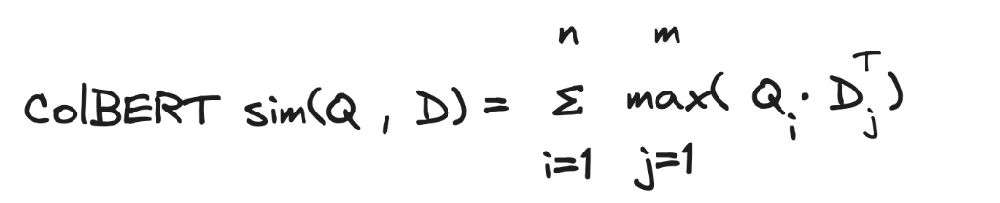

#### Using bf16 tensors

In [42]:
doc_vectors = torch.load(f'{SAVE_DATASET_PATH}/doc_vectors.pt', mmap=True, map_location='cpu')
tensor_info(doc_vectors)

# Assuming Q and D are already defined as:
# Q: (1, 21, 128) -> (q, n, v)
# D: (124, 1030, 128) -> (d, p, v)

# Step 1: Compute the dot product between each Q_i and each D_j
# This results in a tensor of shape (1, 124, 21, 1030) -> (q, d, n, p)
dot_products = torch.einsum('qnv,dpv->qdnp', query_vectors, doc_vectors)
print(dot_products.shape)

# Step 2: For each Q_i, find the maximum dot product value across all D_j
# This results in a tensor of shape (1, 124, 21) -> (q, d, n)
max_dot_products = torch.max(dot_products, dim=-1).values
print(max_dot_products.shape)

# Step 3: Sum these maximum values across all Q_i
# This results in a tensor of shape (1, 124) -> (q, d)
colbert_sim = torch.sum(max_dot_products, dim=2)
print(colbert_sim.shape)

assert colbert_sim.shape[0] == len(query_vectors)

# final similarity score as a scalar, sum across the last dimension
#final_similarity_score = torch.sum(colbert_sim)

#print("CoLBERT similarity score:", final_similarity_score.item())

# each (q, d) score >> which pages are most relevant to each query?
print(colbert_sim)
#page_idxs = torch.argsort(colbert_sim, descending=True, dim=1)#[0][:10]

# get the top 5 pages for each query
topk = 5
real_page_idxs = torch.topk(colbert_sim, topk, dim=1).indices
print(real_page_idxs)

/tmp/ipykernel_328582/3149356668.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  doc_vectors = torch.load(f'{SAVE_DATASET_PATH}/doc_vectors.pt', mmap=True, map_location=

Shape: torch.Size([88, 1030, 128])
Dtype: torch.bfloat16
Device: cpu
Memory: 22.12890625 MB

torch.Size([3, 88, 27, 1030])
torch.Size([3, 88, 27])
torch.Size([3, 88])
tensor([[15.6875, 15.5000, 15.4375, 15.3125, 15.3750, 15.6250, 14.7500, 15.2500,
         15.5625, 20.8750, 18.1250, 20.7500, 18.1250, 16.1250, 22.2500, 20.7500,
         18.1250, 17.8750, 19.2500, 17.5000, 18.0000, 18.0000, 17.8750, 19.3750,
         20.6250, 17.6250, 17.3750, 20.2500, 20.2500, 20.2500, 20.2500, 20.3750,
         20.3750, 18.2500, 16.2500, 15.5000, 21.0000, 21.1250, 17.8750, 17.5000,
         15.8125, 20.8750, 20.6250, 20.7500, 21.0000, 20.8750, 21.0000, 18.7500,
         19.0000, 19.0000, 15.5000, 15.7500, 17.2500, 18.2500, 17.2500, 17.2500,
         14.7500, 15.8125, 15.7500, 15.1875, 15.5625, 15.1875, 15.3125, 15.8750,
         14.6875, 15.6875, 15.6250, 15.6250, 15.1250, 15.7500, 15.7500, 14.8750,
         15.5000, 14.6250, 15.4375, 16.5000, 16.1250, 14.8750, 14.6875, 14.5625,
         14.9375, 15.1875, 15.5000, 15.2500, 15.5000, 14.6875, 15.7500, 15.7500],
        [12.1875, 11.1875,  9.8125

#### Using bit tensors (1st Pass)

Here, we tune for recall and storage

GOAL

--- 

   - do the same with binary tensor to pool large number of candidates
   - we aren't looking for perfect matches, just the most relevant pages to have a high recall

In [44]:
binary_doc_vectors = torch.load(f'{SAVE_DATASET_PATH}/binary_doc_vectors.pt', mmap=True, map_location='cpu')
tensor_info(binary_doc_vectors)

# replace all 0's with -1
binary_query_vectors = np.unpackbits(binary_query_vectors, axis=-1).astype(np.uint8)
#binary_query_vectors[binary_query_vectors == 0] = -1

binary_doc_vectors = np.unpackbits(binary_doc_vectors, axis=-1).astype(np.uint8)
#binary_doc_vectors[binary_doc_vectors == 0] = -1

# Assuming Q and D are already defined as:
# Q: (1, 21, 128) -> (q, n, v)
# D: (124, 1030, 128) -> (d, p, v)

# Step 1: Compute the dot product between each Q_i and each D_j
# This results in a tensor of shape (1, 124, 21, 1030) -> (q, d, n, p)
dot_products = torch.einsum('qnv,dpv->qdnp', 
                            torch.from_numpy(binary_query_vectors), 
                            torch.from_numpy(binary_doc_vectors)
)
tensor_info(dot_products)

# Step 2: For each Q_i, find the maximum dot product value across all D_j
# This results in a tensor of shape (1, 124, 21) -> (q, d, n)
max_dot_products = torch.max(dot_products, dim=-1).values
print(max_dot_products.shape)

# Step 3: Sum these maximum values across all Q_i
# This results in a tensor of shape (1, 124) -> (q, d)
colbert_sim = torch.sum(max_dot_products, dim=2)
print(colbert_sim.shape)

assert colbert_sim.shape[0] == len(query_vectors)

# the final similarity score as a scalar, sum across the last dimension
#final_similarity_score = torch.sum(colbert_sim)

#print("CoLBERT similarity score:", final_similarity_score.item())

# each (q, d) score >> which pages are most relevant to each query?
print(colbert_sim)
#page_idxs = torch.argsort(colbert_sim, descending=True, dim=1)#[0][:10]

# get the top 20 pages for each query
topk = 20
page_idxs = torch.topk(colbert_sim, topk, dim=1).indices
print(page_idxs)

/tmp/ipykernel_328582/3918201211.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  binary_doc_vectors = torch.load(f'{SAVE_DATASET_PATH}/binary_doc_vectors.pt', mmap=True,

Shape: torch.Size([88, 1030, 16])
Dtype: torch.uint8
Device: cpu
Memory: 1.383056640625 MB

Shape: torch.Size([3, 88, 27, 1030])
Dtype: torch.uint8
Device: cpu
Memory: 7.0017242431640625 MB

torch.Size([3, 88, 27])
torch.Size([3, 88])
tensor([[1227, 1225, 1224, 1209, 1172, 1219, 1169, 1192, 1222, 1271, 1211, 1249,
         1239, 1236, 1267, 1251, 1273, 1299, 1223, 1215, 1258, 1268, 1254, 1241,
         1263, 1206, 1202, 1250, 1225, 1247, 1255, 1262, 1237, 1223, 1213, 1223,
         1269, 1279, 1195, 1194, 1222, 1265, 1249, 1230, 1259, 1269, 1259, 1223,
         1227, 1255, 1198, 1210, 1214, 1231, 1210, 1195, 1156, 1182, 1161, 1160,
         1207, 1179, 1168, 1201, 1153, 1172, 1190, 1192, 1182, 1186, 1155, 1178,
         1192, 1166, 1207, 1178, 1204, 1152, 1148, 1192, 1180, 1194, 1212, 1174,
         1171, 1192, 1205, 1197],
        [ 859,  834,  838,  838,  842,  820,  812,  804,  854,  839,  869,  848,
          852,  834,  816,  829,  823,  838,  820,  829,  821,  825,  846,  828,
          846,  863,  871,  835,  828,  821,  839,  828,  828,  815,  855,  831,
          837,  820,  846,  840,  829,  845,  841,  855,  845,  857,  842,  839,
          845,  806,  805,  808

In [45]:
# track indices -> values

page_to_index = [{idx: page.item() for idx, page in enumerate(page_idx)} for page_idx in page_idxs]
rich.print(page_to_index)


[
    {
        0: 17,
        1: 37,
        2: 16,
        3: 9,
        4: 36,
        5: 45,
        6: 21,
        7: 14,
        8: 41,
        9: 24,
        10: 31,
        11: 46,
        12: 44,
        13: 20,
        14: 30,
        15: 49,
        16: 22,
        17: 15,
        18: 27,
        19: 42
    },
    {
        0: 53,
        1: 52,
        2: 26,
        3: 10,
        4: 54,
        5: 55,
        6: 25,
        7: 0,
        8: 45,
        9: 43,
        10: 34,
        11: 8,
        12: 12,
        13: 11,
        14: 22,
        15: 38,
        16: 24,
        17: 48,
        18: 44,
        19: 41
    },
    {
        0: 83,
        1: 63,
        2: 40,
        3: 84,
        4: 51,
        5: 2,
        6: 5,
        7: 8,
        8: 87,
        9: 10,
        10: 13,
        11: 0,
        12: 74,
        13: 79,
        14: 80,
        15: 62,
        16: 50,
        17: 35,
        18: 30,
        19: 78
    }
]

### the 2nd pass

Here, we tune for precision

In [46]:
doc_vectors = torch.load(f'{SAVE_DATASET_PATH}/doc_vectors.pt', mmap=True, map_location='cpu')


/tmp/ipykernel_328582/3597134396.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  doc_vectors = torch.load(f'{SAVE_DATASET_PATH}/doc_vectors.pt', mmap=True, map_location=

In [47]:
# slice the candidates
tensor_info(doc_vectors[page_idxs])

Shape: torch.Size([3, 20, 1030, 128])
Dtype: torch.bfloat16
Device: cpu
Memory: 15.087890625 MB

In [48]:
# compute the max-sim between topk docs retrieved from 1st pass and the query vectors, both in full precision

dot_products = torch.einsum('qnv,qpav->qpna', query_vectors, doc_vectors[page_idxs])
max_dot_products = torch.max(dot_products, dim=-1).values
colbert_sim = torch.sum(max_dot_products, dim=2)
assert colbert_sim.shape[0] == len(query_vectors)

ids = torch.topk(colbert_sim, 5, dim=1).indices
print(ids)


tensor([[ 7,  1, 11, 12,  4],
        [10,  3, 19,  9, 13],
        [ 1,  0,  3, 12, 15]])


In [49]:
rich.print(f'With all bfloat16: \n{real_page_idxs}')

rich.print(
    'With 2-pass retrieval: '
    f'{ [[page_to_index[q][key] for key in idx.tolist()] for q, idx in enumerate(ids)] }'
)

With all bfloat16: 
tensor([[14, 37, 36, 44, 46],
        [34, 10, 43, 41, 11],
        [63, 83, 84, 75, 74]])

With 2-pass retrieval: [[14, 37, 46, 44, 36], [34, 10, 41, 43, 11], [63, 83, 84, 74, 62]]

In [58]:
f'''Coming to our hypothesis at start, we should observe that 2-pass retrieval 
should yield similar results to 1-pass retrieval (full-precision) using exact search, but cheaper.
Validation on more data should further substantiate it. 
'''

'Coming to our hypothesis at start, we should observe that 2-pass retrieval \nshould yield similar results to 1-pass retrieval (full-precision) using exact search, but cheaper.\nValidation on more data should further substantiate it. \n'

### Visualize attention scores

In [59]:
from colpali_engine.interpretability.processor import ColPaliProcessor
import einops
import numpy.typing as npt
from typing_extensions import cast
import matplotlib.pyplot as plt
import seaborn as sns
from dataclasses import asdict

def normalize_attention_map_per_query_token(attention_map: torch.Tensor) -> torch.Tensor:
    # attention_map -> (batch_size, n_text_tokens, n_patch_x, n_patch_y)
    # take max of each square patch (n_patch_x, n_patch_y) -> (batch_size, n_text_tokens, 1, 1)
    attention_map_max = torch.amax(attention_map, dim=(-2, -1), keepdim=True)
    # take min of each square patch (n_patch_x, n_patch_y) -> (batch_size, n_text_tokens, 1, 1)
    attention_map_min = torch.amin(attention_map, dim=(-2, -1), keepdim=True)
    # do min-max normalization
    attention_map_normalized = (attention_map - attention_map_min) / (attention_map_max - attention_map_min + 1e-6)
    return attention_map_normalized

def show_attention_patches(query:str, image:Image, resolution, patch_size):
    if resolution % patch_size == 0:
        num_patches = resolution // patch_size
    else:
        raise ValueError("The patch size must be a divisor of the image resolution.") 

    # square size
    input_image_square = image.resize((resolution, resolution))

    # Preprocess the inputs
    coli_processor = ColPaliProcessor(processor=processor)
    input_text_processed = coli_processor.process_text(query).to(model.device)
    input_image_processed = coli_processor.process_image(image, add_special_prompt=True).to(model.device)

    # Forward pass
    with torch.no_grad():
        output_text = model.forward(**asdict(input_text_processed))
        print(output_text.shape)

    with torch.no_grad():
        output_image = model.forward(**asdict(input_image_processed))
        print(output_image.shape)

    output_image = output_image[:, : coli_processor.processor.image_seq_length, :]
    # divide a patch vector of length `n` to small squares of size (patch_size, patch_size)
    # [..., n] -> [(x,y), (x,y), ..., (x,y)]
    output_image = einops.rearrange(output_image, "b (h w) c -> b h w c", h=num_patches, w=num_patches)
    print(output_image.shape)

    # dot product -> (1, n_text_tokens, n_patch_x, n_patch_y)
    attention_map = torch.einsum("bnk,bijk->bnij", output_text, output_image)  
    attention_map_normalized = normalize_attention_map_per_query_token(attention_map)
    attention_map_normalized = attention_map_normalized.float()
    print(attention_map_normalized.shape)

    # Get text token information
    n_tokens = input_text_processed.input_ids.size(1)
    text_tokens = coli_processor.tokenizer.tokenize(coli_processor.decode(input_text_processed.input_ids[0]))
    print("Text tokens:")
    rich.print(text_tokens)

    img_array = np.array(input_image_square.convert("RGBA"))

    # Create a matrix of subplots
    num_rows = int(np.ceil(np.sqrt(n_tokens - 1)))      # Define the number of rows based on n_tokens
    num_cols = int(np.ceil((n_tokens - 1) / num_rows))  # Define the number of columns based on n_tokens
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 16))
    
    for i, ax in enumerate(axes.flat):
        if i >= n_tokens - 2:  # Ensure we don't go out of bounds
            ax.set_axis_off()  # Turn off axis for blank subplots
            continue
        token_idx = i + 1  # Adjust index to skip <bos> token
        patch_opacities = cast(npt.NDArray, attention_map_normalized[0, token_idx, :, :].cpu().numpy())
        attention_map_image = Image.fromarray((patch_opacities * 255).astype("uint8")).resize(
            input_image_square.size, Image.Resampling.BICUBIC
        )
        ax.imshow(img_array)
        im = ax.imshow(
            attention_map_image,
            cmap=sns.color_palette("mako", as_cmap=True),
            alpha=0.5
        )
        ax.set_axis_off()
        ax.text(0.99, 0.99, text_tokens[token_idx], 
                horizontalalignment='right', 
                verticalalignment='top', 
                transform=ax.transAxes, fontsize=10, color='red')
    
    fig.tight_layout()
    #display(fig)

#### Let's ask few questions and visualize the attention maps

We compare the impact of each token on the top retrieved page for each query

Cache Files: []
Columns: 5
Rows: 88
Column Names: ['tensor_idx', 'image', 'page_number', 'pdf_filename', 'md5_digest']
Shape: (88, 5)
Size (MB): 10.812682151794434

torch.Size([1, 20, 128])
torch.Size([1, 1030, 128])
torch.Size([1, 32, 32, 128])
torch.Size([1, 20, 32, 32])
Text tokens:


[
    '<bos>',
    'show',
    '▁the',
    '▁median',
    '▁home',
    '▁sales',
    '▁price',
    '▁between',
    '▁',
    '2',
    '0',
    '1',
    '7',
    '▁and',
    '▁',
    '2',
    '0',
    '1',
    '9',
    '\n'
]

301

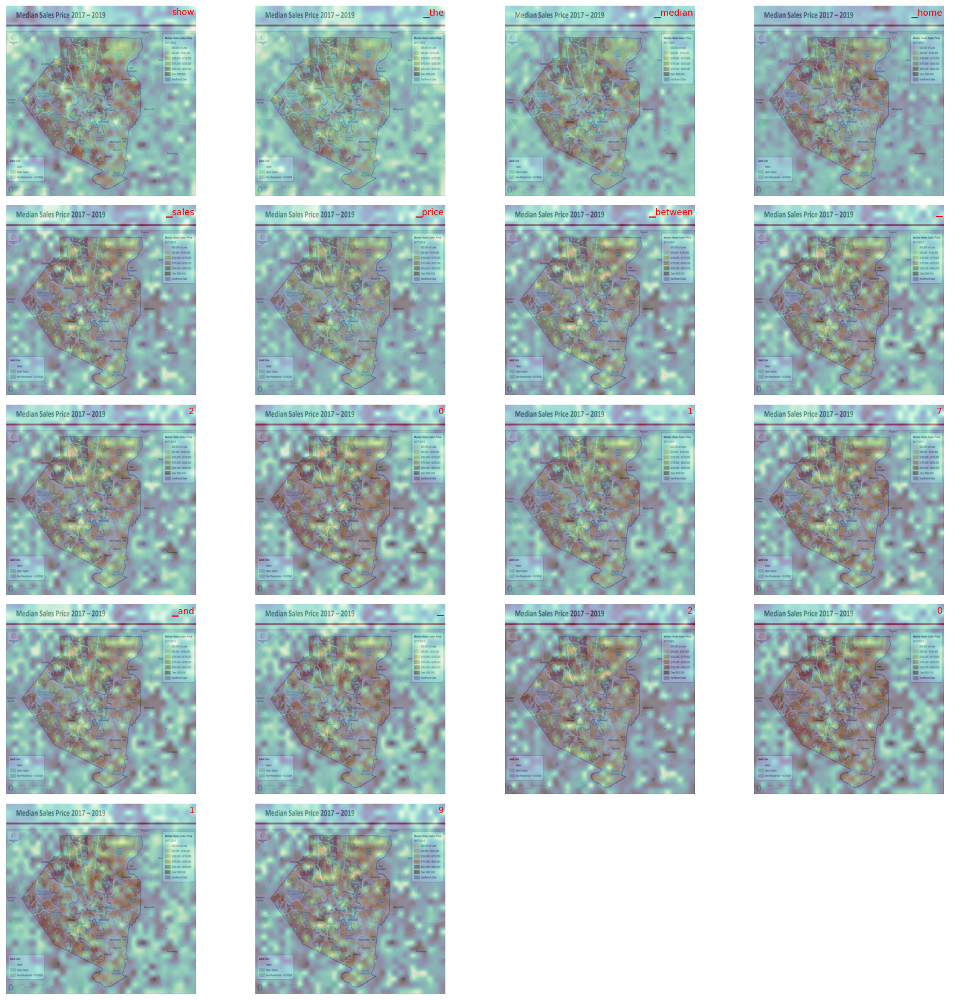

In [61]:
# Page 14 of first pdf is top ranked for this query

ds = get_dataset()
datasets_info(ds)

show_attention_patches(
    'show the median home sales price between 2017 and 2019', 
    image=ds.cast_column('image', datasets.Image())[14]['image'],
    resolution=448, 
    patch_size=14
)

del ds
gc.collect()

Cache Files: []
Columns: 5
Rows: 88
Column Names: ['tensor_idx', 'image', 'page_number', 'pdf_filename', 'md5_digest']
Shape: (88, 5)
Size (MB): 10.812682151794434

torch.Size([1, 10, 128])
torch.Size([1, 1030, 128])
torch.Size([1, 32, 32, 128])
torch.Size([1, 10, 32, 32])
Text tokens:


['<bos>', 'show', '▁the', '▁distribution', '▁of', '▁race', '▁in', '▁Allegheny', '▁county', '\n']

35873

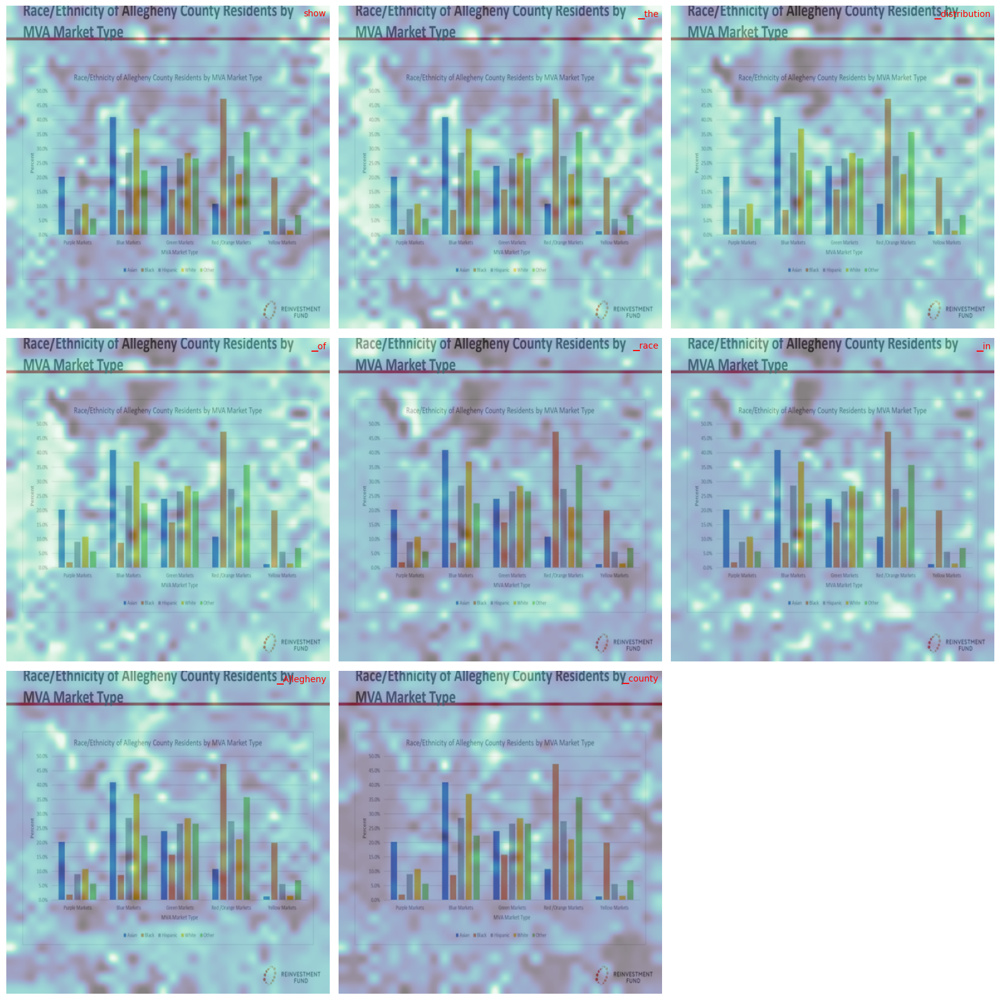

In [62]:
# Page 34 of first pdf is top ranked for this query

ds = get_dataset()
datasets_info(ds)

show_attention_patches(
    'show the distribution of race in Allegheny county',
    image=ds.cast_column('image', datasets.Image())[34]['image'],
    resolution=448, 
    patch_size=14
)

del ds
gc.collect()

Cache Files: []
Columns: 5
Rows: 88
Column Names: ['tensor_idx', 'image', 'page_number', 'pdf_filename', 'md5_digest']
Shape: (88, 5)
Size (MB): 10.812682151794434

torch.Size([1, 6, 128])
torch.Size([1, 1030, 128])
torch.Size([1, 32, 32, 128])
torch.Size([1, 6, 32, 32])
Text tokens:


['<bos>', 'What', '▁is', '▁carbon', '▁footprint', '\n']

16221

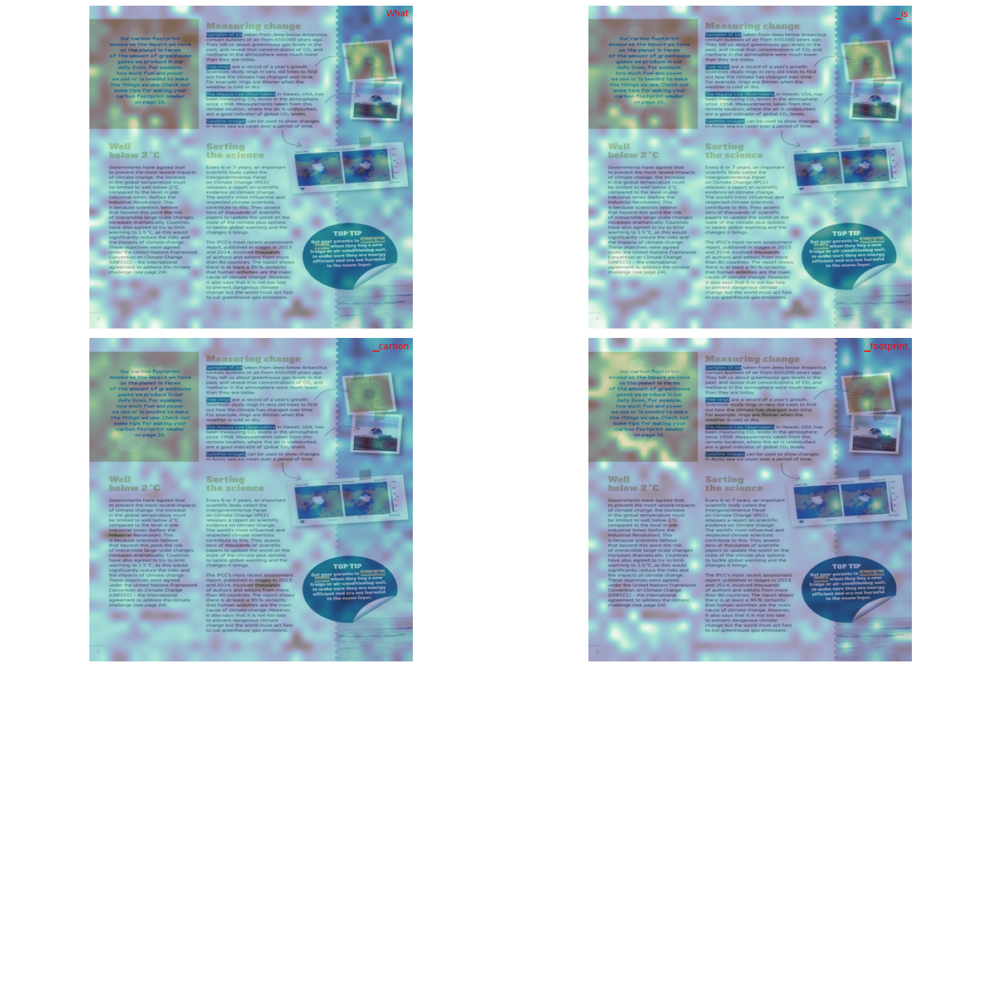

In [63]:
# Page 63 of second pdf is top ranked for this query

ds = get_dataset()
datasets_info(ds)

show_attention_patches(
    'What is carbon footprint',
    image=ds.cast_column('image', datasets.Image())[63]['image'],
    resolution=448, 
    patch_size=14
)

del ds
gc.collect()